# PAPNet

## 1. Setup

Define the desired repository path to be. This is where the `pointcloud-bench` project repository is cloned

In [ ]:
REPO_PATH = "/content/pointcloud-bench"

### 1.1 Clone the working repository

In [ ]:
!git clone --recursive --branch main https://github.com/DavidClaszen/pointcloud-bench {REPO_PATH}

Cloning into '/content/pointcloud-bench'...
remote: Enumerating objects: 257, done.
remote: Counting objects: 100% (100/100), done.
remote: Compressing objects: 100% (67/67), done.
remote: Total 257 (delta 45), reused 73 (delta 31), pack-reused 157 (from 1)
Receiving objects: 100% (257/257), 6.37 MiB | 22.28 MiB/s, done.
Resolving deltas: 100% (97/97), done.
Submodule 'repos/PAPNet' (https://github.com/DavidClaszen/PAPNet.git) registered for path 'repos/PAPNet'
Submodule 'repos/Point-Transformers' (https://github.com/DavidClaszen/Point-Transformers.git) registered for path 'repos/Point-Transformers'
Cloning into '/content/pointcloud-bench/repos/PAPNet'...
remote: Enumerating objects: 124, done.        
remote: Counting objects: 100% (124/124), done.        
remote: Compressing objects: 100% (100/100), done.        
remote: Total 124 (delta 49), reused 77 (delta 23), pack-reused 0 (from 0)        
Receiving objects: 100% (124/124), 9.66 MiB | 14.60 MiB/s, done.
Resolving deltas: 100% (4

`cd` to the repo then pull the latest changes to the repository (for rolling changes)

In [ ]:
%cd {REPO_PATH}
!git checkout papnet-analysis
!git submodule update --init --recursive

/content/pointcloud-bench
M	repos/PAPNet
Branch 'papnet-analysis' set up to track remote branch 'papnet-analysis' from 'origin'.
Switched to a new branch 'papnet-analysis'
Submodule path 'repos/PAPNet': checked out 'ab5e0dcc281573ae29d6956f1dfd76f6bbbe4b72'


In [ ]:
%cd {REPO_PATH}
!git pull && git submodule update --recursive

/content/pointcloud-bench
Already up to date.


### 1.2 Mount the dataset from Google Drive

In [ ]:
import os
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


Inside the dataset folder, we expect the presence of three files:
- partialmodelnet40.tar.gz
- fullmodelnet40.tar

In [ ]:
# Define the path to the dataset in Google Drive where the data and models are saved
# The folder must contain the following files:
# - partialmodelnet40.tar.gz
# - fullmodelnet40.tar.gz
# - pm40_extreme_partiality.tar.gz
# - PAPnet_final_models.tar.gz
drive_folder_path = '/content/drive/MyDrive/_Temp/cs7643-final-proj/'

# Check contents to make sure it's there
file_exists = lambda path: os.path.exists(path)
print("partialmodelnet40: ", "OK" if file_exists(os.path.join(drive_folder_path, 'partialmodelnet40.tar.gz')) else "NOT FOUND")
print("fullmodelnet40: ", "OK" if file_exists(os.path.join(drive_folder_path, 'fullmodelnet40.tar.gz')) else "NOT FOUND")
print("pm40_extreme_partiality: ", "OK" if file_exists(os.path.join(drive_folder_path, 'pm40_extreme_partiality.tar.gz')) else "NOT FOUND")
print("models: ", "OK" if file_exists(os.path.join(drive_folder_path, 'PAPnet_final_models.tar.gz')) else "NOT FOUND")

partialmodelnet40:  OK
fullmodelnet40:  OK
pm40_extreme_partiality:  OK
models:  OK


### 1.2 Install Requirements

In [ ]:
%pip install -r envs/papnet/requirements.txt  --no-deps

Looking in indexes: https://pypi.org/simple, https://download.pytorch.org/whl/cu126
  Cloning https://github.com/AMLab-Amsterdam/lie_learn (to revision master) to /tmp/pip-install-xm0ti24c/lie-learn_029f7a9dfbb5467ea7e817767998232d
  Running command git clone --filter=blob:none --quiet https://github.com/AMLab-Amsterdam/lie_learn /tmp/pip-install-xm0ti24c/lie-learn_029f7a9dfbb5467ea7e817767998232d
  Resolved https://github.com/AMLab-Amsterdam/lie_learn to commit edf012f5f60af320175d2e6269db78b984b5bfc3
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 37.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.2/87.2 kB 9.4 MB/s eta 0:00:00
  Created wheel for lie_learn: filename=lie_learn-0.0.2-cp312-cp312-linux_x86_64.whl size=16619318 sha256=c598e9ea8c3cc805bdb8c284b780d1b82cd3b910efc4965576fd940aa6e63726
  Stored in directory: /tmp/pip

### 1.3 Copy and extract the data and models to local working directory

In [ ]:
# Copy select files from Google Drive to the repo dataset folder
!rsync -avP {drive_folder_path}/partialmodelnet40.tar.gz {REPO_PATH}/datasets
!rsync -avP {drive_folder_path}/fullmodelnet40.tar.gz {REPO_PATH}/datasets
!rsync -avP {drive_folder_path}/pm40_extreme_partiality.tar.gz {REPO_PATH}/datasets


sending incremental file list
partialmodelnet40.tar.gz
  2,162,130,396 100%   75.86MB/s    0:00:27 (xfr#1, to-chk=0/1)

sent 2,162,658,366 bytes  received 35 bytes  73,310,454.27 bytes/sec
total size is 2,162,130,396  speedup is 1.00
sending incremental file list
fullmodelnet40.tar.gz
  1,833,210,387 100%   59.86MB/s    0:00:29 (xfr#1, to-chk=0/1)

sent 1,833,658,058 bytes  received 35 bytes  60,119,937.48 bytes/sec
total size is 1,833,210,387  speedup is 1.00
sending incremental file list
pm40_extreme_partiality.tar.gz
  8,334,013,260 100%   74.63MB/s    0:01:46 (xfr#1, to-chk=0/1)

sent 8,336,048,044 bytes  received 35 bytes  76,829,936.21 bytes/sec
total size is 8,334,013,260  speedup is 1.00


In [ ]:
# Also copy the models
!rsync -avP {drive_folder_path}/PAPnet_final_models.tar.gz {REPO_PATH}/repos/PAPNet/trained_models/

sending incremental file list
created directory /content/pointcloud-bench/repos/PAPNet/trained_models
PAPnet_final_models.tar.gz
      7,766,652 100%   18.96MB/s    0:00:00 (xfr#1, to-chk=0/1)

sent 7,768,662 bytes  received 111 bytes  15,537,546.00 bytes/sec
total size is 7,766,652  speedup is 1.00


In [ ]:
# Extract zip file
%cd {REPO_PATH}
!tar -xvzf datasets/partialmodelnet40.tar.gz -C datasets
!tar -xvzf datasets/fullmodelnet40.tar.gz -C datasets
!tar -xvzf datasets/pm40_extreme_partiality.tar.gz -C datasets
!tar -xvzf repos/PAPNet/trained_models/PAPnet_final_models.tar.gz -C repos/PAPNet/trained_models/

/content/pointcloud-bench
partialmodelnet40/
partialmodelnet40/test_labels.npy
partialmodelnet40/test_gt_tra.npy
partialmodelnet40/test_gt_rot.npy
partialmodelnet40/partialmodelnet40_shape_names.txt
partialmodelnet40/partialmodelnet40_test.txt
partialmodelnet40/partialmodelnet40_train.txt
partialmodelnet40/train_points.npy
partialmodelnet40/train_labels.npy
partialmodelnet40/train_gt_tra.npy
partialmodelnet40/train_gt_rot.npy
partialmodelnet40/test_points.npy
fullmodelnet40/
fullmodelnet40/test_filenames.txt
fullmodelnet40/test_gt_rot.npy
fullmodelnet40/test_gt_tra.npy
fullmodelnet40/test_labels.npy
fullmodelnet40/test_points.npy
fullmodelnet40/train_filenames.txt
fullmodelnet40/train_gt_rot.npy
fullmodelnet40/train_gt_tra.npy
fullmodelnet40/train_labels.npy
fullmodelnet40/train_points.npy
pm40_partiality_level/
pm40_partiality_level/test_points_10.npy
pm40_partiality_level/test_points_20.npy
pm40_partiality_level/test_points_30.npy
pm40_partiality_level/test_points_40.npy
pm40_partial

## 2. Inference
Let us run the `test.py` script to evaluate PAPNet on various scenarios.

In [ ]:
%cd {REPO_PATH}/repos/PAPNet

/content/pointcloud-bench/repos/PAPNet


In [ ]:
from eval_models import eval_papnet

/content/pointcloud-bench/repos/PAPNet/lib/transformations.py:67: SyntaxWarning: invalid escape sequence '\*'
  numpy.dot(M, v) for shape (4, \*) column vectors, respectively
/content/pointcloud-bench/repos/PAPNet/lib/transformations.py:893: SyntaxWarning: invalid escape sequence '\*'
  v0 and v1 are shape (ndims, \*) arrays of at least ndims non-homogeneous
/content/pointcloud-bench/repos/PAPNet/lib/transformations.py:1002: SyntaxWarning: invalid escape sequence '\*'
  v0 and v1 are shape (3, \*) or (4, \*) arrays of at least 3 points.


### 2.1 Trained on full dataset, evaluated on full dataset

In [ ]:
result_fullmodel_fulltest = eval_papnet(model_path="trained_models/full_model.pth",
                                        dataset="pm40",
                                        data_path="../../datasets/fullmodelnet40/",
                                        rot_k=20,
                                        batch_size=256)

The size of test data is 2468
# classifier parameters: 1154874


100%|██████████| 10/10 [00:31<00:00,  3.10s/it]

k=1, Test Ins Acc: 0.845219, Test Bin Top-k Acc: 0.274311
k=2, Test Ins Acc: 0.847245, Test Bin Top-k Acc: 0.422609
k=3, Test Ins Acc: 0.848865, Test Bin Top-k Acc: 0.528768
k=4, Test Ins Acc: 0.850486, Test Bin Top-k Acc: 0.612642
k=5, Test Ins Acc: 0.848055, Test Bin Top-k Acc: 0.680713
k=6, Test Ins Acc: 0.848460, Test Bin Top-k Acc: 0.737844
k=7, Test Ins Acc: 0.847245, Test Bin Top-k Acc: 0.775527
k=8, Test Ins Acc: 0.848865, Test Bin Top-k Acc: 0.804295
k=9, Test Ins Acc: 0.848055, Test Bin Top-k Acc: 0.829822
k=10, Test Ins Acc: 0.848055, Test Bin Top-k Acc: 0.848460
k=11, Test Ins Acc: 0.849271, Test Bin Top-k Acc: 0.867909
k=12, Test Ins Acc: 0.849676, Test Bin Top-k Acc: 0.882496
k=13, Test Ins Acc: 0.849676, Test Bin Top-k Acc: 0.892626
k=14, Test Ins Acc: 0.850081, Test Bin Top-k Acc: 0.905997
k=15, Test Ins Acc: 0.850081, Test Bin Top-k Acc: 0.912480
k=16, Test Ins Acc: 0.848865, Test Bin Top-k Acc: 0.917747
k=17, Test Ins Acc: 0.848865, Test Bin Top-k Acc: 0.925446
k=18, 

### 2.2 Trained on full dataset, evaluated on partial dataset

In [ ]:
result_fullmodel_partialtest = eval_papnet(model_path="trained_models/full_model.pth",
                                            dataset="pm40",
                                            data_path="../../datasets/partialmodelnet40/",
                                            rot_k=20,
                                            batch_size=256)

The size of test data is 2468
# classifier parameters: 1154874


100%|██████████| 10/10 [00:49<00:00,  4.94s/it]

k=1, Test Ins Acc: 0.358185, Test Bin Top-k Acc: 0.121556
k=2, Test Ins Acc: 0.365073, Test Bin Top-k Acc: 0.204619
k=3, Test Ins Acc: 0.368720, Test Bin Top-k Acc: 0.275527
k=4, Test Ins Acc: 0.370746, Test Bin Top-k Acc: 0.338331
k=5, Test Ins Acc: 0.370746, Test Bin Top-k Acc: 0.390600
k=6, Test Ins Acc: 0.370746, Test Bin Top-k Acc: 0.444489
k=7, Test Ins Acc: 0.368720, Test Bin Top-k Acc: 0.477310
k=8, Test Ins Acc: 0.370340, Test Bin Top-k Acc: 0.508914
k=9, Test Ins Acc: 0.368314, Test Bin Top-k Acc: 0.542545
k=10, Test Ins Acc: 0.366694, Test Bin Top-k Acc: 0.566856
k=11, Test Ins Acc: 0.363452, Test Bin Top-k Acc: 0.590762
k=12, Test Ins Acc: 0.363857, Test Bin Top-k Acc: 0.611426
k=13, Test Ins Acc: 0.363047, Test Bin Top-k Acc: 0.626418
k=14, Test Ins Acc: 0.362642, Test Bin Top-k Acc: 0.642626
k=15, Test Ins Acc: 0.363857, Test Bin Top-k Acc: 0.658833
k=16, Test Ins Acc: 0.363452, Test Bin Top-k Acc: 0.675446
k=17, Test Ins Acc: 0.365073, Test Bin Top-k Acc: 0.683955
k=18, 

In [ ]:
# partial_10
result_fullmodel_partialtest_10 = eval_papnet(model_path="trained_models/full_model.pth",
                                             dataset="pm40",
                                             data_path="../../datasets/pm40_partiality_level/",
                                             rot_k=20,
                                             partiality="_10",
                                             batch_size=256)

The size of test data is 2468
# classifier parameters: 1154874


100%|██████████| 10/10 [00:31<00:00,  3.14s/it]

k=1, Test Ins Acc: 0.068476, Test Bin Top-k Acc: 0.044976
k=2, Test Ins Acc: 0.066856, Test Bin Top-k Acc: 0.079011
k=3, Test Ins Acc: 0.066856, Test Bin Top-k Acc: 0.113857
k=4, Test Ins Acc: 0.069692, Test Bin Top-k Acc: 0.141005
k=5, Test Ins Acc: 0.069692, Test Bin Top-k Acc: 0.167342
k=6, Test Ins Acc: 0.070097, Test Bin Top-k Acc: 0.190438
k=7, Test Ins Acc: 0.070502, Test Bin Top-k Acc: 0.215559
k=8, Test Ins Acc: 0.071313, Test Bin Top-k Acc: 0.240276
k=9, Test Ins Acc: 0.069692, Test Bin Top-k Acc: 0.262966
k=10, Test Ins Acc: 0.070502, Test Bin Top-k Acc: 0.289303
k=11, Test Ins Acc: 0.070908, Test Bin Top-k Acc: 0.307536
k=12, Test Ins Acc: 0.070502, Test Bin Top-k Acc: 0.326175
k=13, Test Ins Acc: 0.071313, Test Bin Top-k Acc: 0.344814
k=14, Test Ins Acc: 0.070502, Test Bin Top-k Acc: 0.364263
k=15, Test Ins Acc: 0.071313, Test Bin Top-k Acc: 0.385332
k=16, Test Ins Acc: 0.071313, Test Bin Top-k Acc: 0.401945
k=17, Test Ins Acc: 0.071313, Test Bin Top-k Acc: 0.418558
k=18, 

In [ ]:
# partial_20
result_fullmodel_partialtest_20 = eval_papnet(model_path="trained_models/full_model.pth",
                                             dataset="pm40",
                                             data_path="../../datasets/pm40_partiality_level/",
                                             rot_k=20,
                                             partiality="_20",
                                             batch_size=256)

The size of test data is 2468
# classifier parameters: 1154874


100%|██████████| 10/10 [00:31<00:00,  3.12s/it]

k=1, Test Ins Acc: 0.121961, Test Bin Top-k Acc: 0.068476
k=2, Test Ins Acc: 0.120746, Test Bin Top-k Acc: 0.117909
k=3, Test Ins Acc: 0.123582, Test Bin Top-k Acc: 0.151945
k=4, Test Ins Acc: 0.123177, Test Bin Top-k Acc: 0.184360
k=5, Test Ins Acc: 0.121556, Test Bin Top-k Acc: 0.213533
k=6, Test Ins Acc: 0.119935, Test Bin Top-k Acc: 0.244327
k=7, Test Ins Acc: 0.120746, Test Bin Top-k Acc: 0.271475
k=8, Test Ins Acc: 0.119935, Test Bin Top-k Acc: 0.290519
k=9, Test Ins Acc: 0.121556, Test Bin Top-k Acc: 0.309562
k=10, Test Ins Acc: 0.121961, Test Bin Top-k Acc: 0.335900
k=11, Test Ins Acc: 0.123177, Test Bin Top-k Acc: 0.358995
k=12, Test Ins Acc: 0.121961, Test Bin Top-k Acc: 0.379660
k=13, Test Ins Acc: 0.121556, Test Bin Top-k Acc: 0.399514
k=14, Test Ins Acc: 0.121961, Test Bin Top-k Acc: 0.418963
k=15, Test Ins Acc: 0.121961, Test Bin Top-k Acc: 0.435981
k=16, Test Ins Acc: 0.122771, Test Bin Top-k Acc: 0.450972
k=17, Test Ins Acc: 0.122771, Test Bin Top-k Acc: 0.471232
k=18, 

In [ ]:
# partial_30
result_fullmodel_partialtest_30 = eval_papnet(model_path="trained_models/full_model.pth",
                                             dataset="pm40",
                                             data_path="../../datasets/pm40_partiality_level/",
                                             rot_k=20,
                                             partiality="_30",
                                             batch_size=256)

The size of test data is 2468
# classifier parameters: 1154874


100%|██████████| 10/10 [00:31<00:00,  3.11s/it]

k=1, Test Ins Acc: 0.190032, Test Bin Top-k Acc: 0.088736
k=2, Test Ins Acc: 0.190032, Test Bin Top-k Acc: 0.154781
k=3, Test Ins Acc: 0.190032, Test Bin Top-k Acc: 0.196515
k=4, Test Ins Acc: 0.188817, Test Bin Top-k Acc: 0.240276
k=5, Test Ins Acc: 0.191248, Test Bin Top-k Acc: 0.279173
k=6, Test Ins Acc: 0.189222, Test Bin Top-k Acc: 0.305511
k=7, Test Ins Acc: 0.187601, Test Bin Top-k Acc: 0.330227
k=8, Test Ins Acc: 0.186791, Test Bin Top-k Acc: 0.350081
k=9, Test Ins Acc: 0.187196, Test Bin Top-k Acc: 0.377634
k=10, Test Ins Acc: 0.187196, Test Bin Top-k Acc: 0.397488
k=11, Test Ins Acc: 0.188006, Test Bin Top-k Acc: 0.418963
k=12, Test Ins Acc: 0.187601, Test Bin Top-k Acc: 0.435981
k=13, Test Ins Acc: 0.187196, Test Bin Top-k Acc: 0.457861
k=14, Test Ins Acc: 0.186791, Test Bin Top-k Acc: 0.477310
k=15, Test Ins Acc: 0.187196, Test Bin Top-k Acc: 0.495138
k=16, Test Ins Acc: 0.187196, Test Bin Top-k Acc: 0.508914
k=17, Test Ins Acc: 0.186791, Test Bin Top-k Acc: 0.526742
k=18, 

In [ ]:
# partial_40
result_fullmodel_partialtest_40 = eval_papnet(model_path="trained_models/full_model.pth",
                                             dataset="pm40",
                                             data_path="../../datasets/pm40_partiality_level/",
                                             rot_k=20,
                                             partiality="_40",
                                             batch_size=256)

The size of test data is 2468
# classifier parameters: 1154874


100%|██████████| 10/10 [00:31<00:00,  3.13s/it]

k=1, Test Ins Acc: 0.270259, Test Bin Top-k Acc: 0.108995
k=2, Test Ins Acc: 0.269044, Test Bin Top-k Acc: 0.176661
k=3, Test Ins Acc: 0.270259, Test Bin Top-k Acc: 0.241086
k=4, Test Ins Acc: 0.273096, Test Bin Top-k Acc: 0.292545
k=5, Test Ins Acc: 0.272690, Test Bin Top-k Acc: 0.335494
k=6, Test Ins Acc: 0.267828, Test Bin Top-k Acc: 0.370340
k=7, Test Ins Acc: 0.269044, Test Bin Top-k Acc: 0.399109
k=8, Test Ins Acc: 0.267828, Test Bin Top-k Acc: 0.429498
k=9, Test Ins Acc: 0.268233, Test Bin Top-k Acc: 0.461102
k=10, Test Ins Acc: 0.269449, Test Bin Top-k Acc: 0.479335
k=11, Test Ins Acc: 0.270259, Test Bin Top-k Acc: 0.499190
k=12, Test Ins Acc: 0.269854, Test Bin Top-k Acc: 0.523501
k=13, Test Ins Acc: 0.269044, Test Bin Top-k Acc: 0.540519
k=14, Test Ins Acc: 0.267828, Test Bin Top-k Acc: 0.556726
k=15, Test Ins Acc: 0.268233, Test Bin Top-k Acc: 0.570097
k=16, Test Ins Acc: 0.267828, Test Bin Top-k Acc: 0.585900
k=17, Test Ins Acc: 0.268233, Test Bin Top-k Acc: 0.597245
k=18, 

### 2.3 Trained on partial dataset, evaluated on full dataset

In [ ]:
result_partialmodel_fulltest = eval_papnet(model_path="trained_models/partial_model.pth",
                                              dataset="pm40",
                                              data_path="../../datasets/fullmodelnet40/",
                                              rot_k=20,
                                              batch_size=256)

The size of test data is 2468
# classifier parameters: 1154874


100%|██████████| 10/10 [00:31<00:00,  3.17s/it]

k=1, Test Ins Acc: 0.651945, Test Bin Top-k Acc: 0.291734
k=2, Test Ins Acc: 0.662885, Test Bin Top-k Acc: 0.425041
k=3, Test Ins Acc: 0.671394, Test Bin Top-k Acc: 0.489465
k=4, Test Ins Acc: 0.673825, Test Bin Top-k Acc: 0.528363
k=5, Test Ins Acc: 0.677877, Test Bin Top-k Acc: 0.561183
k=6, Test Ins Acc: 0.679498, Test Bin Top-k Acc: 0.588331
k=7, Test Ins Acc: 0.679498, Test Bin Top-k Acc: 0.623582
k=8, Test Ins Acc: 0.678282, Test Bin Top-k Acc: 0.641815
k=9, Test Ins Acc: 0.683144, Test Bin Top-k Acc: 0.666532
k=10, Test Ins Acc: 0.683144, Test Bin Top-k Acc: 0.687196
k=11, Test Ins Acc: 0.684765, Test Bin Top-k Acc: 0.708266
k=12, Test Ins Acc: 0.681929, Test Bin Top-k Acc: 0.722853
k=13, Test Ins Acc: 0.681929, Test Bin Top-k Acc: 0.737844
k=14, Test Ins Acc: 0.682334, Test Bin Top-k Acc: 0.754052
k=15, Test Ins Acc: 0.680713, Test Bin Top-k Acc: 0.764587
k=16, Test Ins Acc: 0.680308, Test Bin Top-k Acc: 0.782415
k=17, Test Ins Acc: 0.680713, Test Bin Top-k Acc: 0.792545
k=18, 

### 2.4 Trained on partial dataset, evaluated on partial dataset

In [ ]:
result_partialmodel_partialtest = eval_papnet(model_path="trained_models/partial_model.pth",
                                              dataset="pm40",
                                              data_path="../../datasets/partialmodelnet40/",
                                              rot_k=20,
                                              batch_size=256)

The size of test data is 2468
# classifier parameters: 1154874


100%|██████████| 10/10 [00:31<00:00,  3.15s/it]

k=1, Test Ins Acc: 0.809968, Test Bin Top-k Acc: 0.469611
k=2, Test Ins Acc: 0.820908, Test Bin Top-k Acc: 0.686386
k=3, Test Ins Acc: 0.824554, Test Bin Top-k Acc: 0.761345
k=4, Test Ins Acc: 0.824959, Test Bin Top-k Acc: 0.801864
k=5, Test Ins Acc: 0.824959, Test Bin Top-k Acc: 0.828606
k=6, Test Ins Acc: 0.823339, Test Bin Top-k Acc: 0.846840
k=7, Test Ins Acc: 0.825770, Test Bin Top-k Acc: 0.866288
k=8, Test Ins Acc: 0.828201, Test Bin Top-k Acc: 0.878849
k=9, Test Ins Acc: 0.826985, Test Bin Top-k Acc: 0.888574
k=10, Test Ins Acc: 0.829822, Test Bin Top-k Acc: 0.900324
k=11, Test Ins Acc: 0.830227, Test Bin Top-k Acc: 0.905997
k=12, Test Ins Acc: 0.831442, Test Bin Top-k Acc: 0.917747
k=13, Test Ins Acc: 0.832253, Test Bin Top-k Acc: 0.927066
k=14, Test Ins Acc: 0.832658, Test Bin Top-k Acc: 0.931524
k=15, Test Ins Acc: 0.832253, Test Bin Top-k Acc: 0.934765
k=16, Test Ins Acc: 0.832253, Test Bin Top-k Acc: 0.941653
k=17, Test Ins Acc: 0.834279, Test Bin Top-k Acc: 0.945300
k=18, 

In [ ]:
# partial_10
result_partialmodel_partialtest_10 = eval_papnet(model_path="trained_models/partial_model.pth",
                                             dataset="pm40",
                                             data_path="../../datasets/pm40_partiality_level/",
                                             rot_k=20,
                                             partiality="_10",
                                             batch_size=256)

The size of test data is 2468
# classifier parameters: 1154874


100%|██████████| 10/10 [00:31<00:00,  3.13s/it]

k=1, Test Ins Acc: 0.104133, Test Bin Top-k Acc: 0.072934
k=2, Test Ins Acc: 0.109400, Test Bin Top-k Acc: 0.116694
k=3, Test Ins Acc: 0.107780, Test Bin Top-k Acc: 0.155592
k=4, Test Ins Acc: 0.107780, Test Bin Top-k Acc: 0.191248
k=5, Test Ins Acc: 0.110616, Test Bin Top-k Acc: 0.221232
k=6, Test Ins Acc: 0.110211, Test Bin Top-k Acc: 0.250000
k=7, Test Ins Acc: 0.114263, Test Bin Top-k Acc: 0.278363
k=8, Test Ins Acc: 0.115883, Test Bin Top-k Acc: 0.308347
k=9, Test Ins Acc: 0.118720, Test Bin Top-k Acc: 0.335089
k=10, Test Ins Acc: 0.119530, Test Bin Top-k Acc: 0.356564
k=11, Test Ins Acc: 0.117504, Test Bin Top-k Acc: 0.381280
k=12, Test Ins Acc: 0.118720, Test Bin Top-k Acc: 0.405186
k=13, Test Ins Acc: 0.117504, Test Bin Top-k Acc: 0.423015
k=14, Test Ins Acc: 0.118720, Test Bin Top-k Acc: 0.440843
k=15, Test Ins Acc: 0.117504, Test Bin Top-k Acc: 0.454619
k=16, Test Ins Acc: 0.117909, Test Bin Top-k Acc: 0.473258
k=17, Test Ins Acc: 0.117909, Test Bin Top-k Acc: 0.493517
k=18, 

In [ ]:
# partial_20
result_partialmodel_partialtest_20 = eval_papnet(model_path="trained_models/partial_model.pth",
                                             dataset="pm40",
                                             data_path="../../datasets/pm40_partiality_level/",
                                             rot_k=20,
                                             partiality="_20",
                                             batch_size=256)

The size of test data is 2468
# classifier parameters: 1154874


100%|██████████| 10/10 [00:31<00:00,  3.17s/it]

k=1, Test Ins Acc: 0.229741, Test Bin Top-k Acc: 0.127634
k=2, Test Ins Acc: 0.229741, Test Bin Top-k Acc: 0.211912
k=3, Test Ins Acc: 0.230956, Test Bin Top-k Acc: 0.257699
k=4, Test Ins Acc: 0.234603, Test Bin Top-k Acc: 0.302269
k=5, Test Ins Acc: 0.233387, Test Bin Top-k Acc: 0.337925
k=6, Test Ins Acc: 0.235413, Test Bin Top-k Acc: 0.367099
k=7, Test Ins Acc: 0.237439, Test Bin Top-k Acc: 0.397083
k=8, Test Ins Acc: 0.236224, Test Bin Top-k Acc: 0.425446
k=9, Test Ins Acc: 0.234603, Test Bin Top-k Acc: 0.450972
k=10, Test Ins Acc: 0.236629, Test Bin Top-k Acc: 0.472853
k=11, Test Ins Acc: 0.236629, Test Bin Top-k Acc: 0.494733
k=12, Test Ins Acc: 0.236629, Test Bin Top-k Acc: 0.517828
k=13, Test Ins Acc: 0.236224, Test Bin Top-k Acc: 0.536872
k=14, Test Ins Acc: 0.237034, Test Bin Top-k Acc: 0.556321
k=15, Test Ins Acc: 0.238655, Test Bin Top-k Acc: 0.579011
k=16, Test Ins Acc: 0.236629, Test Bin Top-k Acc: 0.596029
k=17, Test Ins Acc: 0.235413, Test Bin Top-k Acc: 0.616288
k=18, 

In [ ]:
# partial_30
result_partialmodel_partialtest_30 = eval_papnet(model_path="trained_models/partial_model.pth",
                                             dataset="pm40",
                                             data_path="../../datasets/pm40_partiality_level/",
                                             rot_k=20,
                                             partiality="_30",
                                             batch_size=256)

The size of test data is 2468
# classifier parameters: 1154874


100%|██████████| 10/10 [00:31<00:00,  3.13s/it]

k=1, Test Ins Acc: 0.415316, Test Bin Top-k Acc: 0.219206
k=2, Test Ins Acc: 0.419773, Test Bin Top-k Acc: 0.327796
k=3, Test Ins Acc: 0.421394, Test Bin Top-k Acc: 0.403971
k=4, Test Ins Acc: 0.429092, Test Bin Top-k Acc: 0.457861
k=5, Test Ins Acc: 0.429498, Test Bin Top-k Acc: 0.491896
k=6, Test Ins Acc: 0.430713, Test Bin Top-k Acc: 0.528363
k=7, Test Ins Acc: 0.433144, Test Bin Top-k Acc: 0.558752
k=8, Test Ins Acc: 0.430713, Test Bin Top-k Acc: 0.584684
k=9, Test Ins Acc: 0.429903, Test Bin Top-k Acc: 0.606969
k=10, Test Ins Acc: 0.431524, Test Bin Top-k Acc: 0.630875
k=11, Test Ins Acc: 0.433549, Test Bin Top-k Acc: 0.656807
k=12, Test Ins Acc: 0.429903, Test Bin Top-k Acc: 0.676661
k=13, Test Ins Acc: 0.431524, Test Bin Top-k Acc: 0.694489
k=14, Test Ins Acc: 0.431118, Test Bin Top-k Acc: 0.707861
k=15, Test Ins Acc: 0.429498, Test Bin Top-k Acc: 0.726094
k=16, Test Ins Acc: 0.429498, Test Bin Top-k Acc: 0.736629
k=17, Test Ins Acc: 0.427066, Test Bin Top-k Acc: 0.744733
k=18, 

In [36]:
# partial_40
result_partialmodel_partialtest_40 = eval_papnet(model_path="trained_models/partial_model.pth",
                                             dataset="pm40",
                                             data_path="../../datasets/pm40_partiality_level/",
                                             rot_k=20,
                                             partiality="_40",
                                             batch_size=256)

The size of test data is 2468
# classifier parameters: 1154874


100%|██████████| 10/10 [00:31<00:00,  3.14s/it]

k=1, Test Ins Acc: 0.623177, Test Bin Top-k Acc: 0.346840
k=2, Test Ins Acc: 0.636143, Test Bin Top-k Acc: 0.504862
k=3, Test Ins Acc: 0.637763, Test Bin Top-k Acc: 0.589141
k=4, Test Ins Acc: 0.641815, Test Bin Top-k Acc: 0.632496
k=5, Test Ins Acc: 0.644246, Test Bin Top-k Acc: 0.670989
k=6, Test Ins Acc: 0.649514, Test Bin Top-k Acc: 0.698136
k=7, Test Ins Acc: 0.653160, Test Bin Top-k Acc: 0.715559
k=8, Test Ins Acc: 0.652350, Test Bin Top-k Acc: 0.741896
k=9, Test Ins Acc: 0.650729, Test Bin Top-k Acc: 0.765802
k=10, Test Ins Acc: 0.651540, Test Bin Top-k Acc: 0.787682
k=11, Test Ins Acc: 0.653971, Test Bin Top-k Acc: 0.801053
k=12, Test Ins Acc: 0.654781, Test Bin Top-k Acc: 0.813614
k=13, Test Ins Acc: 0.651945, Test Bin Top-k Acc: 0.823744
k=14, Test Ins Acc: 0.650729, Test Bin Top-k Acc: 0.836305
k=15, Test Ins Acc: 0.648298, Test Bin Top-k Acc: 0.844003
k=16, Test Ins Acc: 0.648298, Test Bin Top-k Acc: 0.850891
k=17, Test Ins Acc: 0.645867, Test Bin Top-k Acc: 0.859400
k=18, 

In [38]:
import os
import numpy as np
import pickle

# Ensure the results directory exists
results_dir = os.path.join(drive_folder_path, "results")
os.makedirs(results_dir, exist_ok=True)

def save_to_pickle(filename, data):
    filepath = os.path.join(results_dir, filename)
    with open(filepath, 'wb') as f:
        pickle.dump(data, f)

save_to_pickle("result_fullmodel_fulltest.pkl", result_fullmodel_fulltest)
save_to_pickle("result_fullmodel_partialtest.pkl", result_fullmodel_partialtest)
save_to_pickle("result_fullmodel_partialtest_10.pkl", result_fullmodel_partialtest_10)
save_to_pickle("result_fullmodel_partialtest_20.pkl", result_fullmodel_partialtest_20)
save_to_pickle("result_fullmodel_partialtest_30.pkl", result_fullmodel_partialtest_30)
save_to_pickle("result_fullmodel_partialtest_40.pkl", result_fullmodel_partialtest_40)
save_to_pickle("result_partialmodel_fulltest.pkl", result_partialmodel_fulltest)
save_to_pickle("result_partialmodel_partialtest.pkl", result_partialmodel_partialtest)
save_to_pickle("result_partialmodel_partialtest_10.pkl", result_partialmodel_partialtest_10)
save_to_pickle("result_partialmodel_partialtest_20.pkl", result_partialmodel_partialtest_20)
save_to_pickle("result_partialmodel_partialtest_30.pkl", result_partialmodel_partialtest_30)
save_to_pickle("result_partialmodel_partialtest_40.pkl", result_partialmodel_partialtest_40)

## Reloading the data
Start the code from this point to save time running the models next time

The result_* variables are formatted like this:

```python    
Returns:
    y_pred_cls (ndarray): Predicted classification labels. (N,)
    y_true_cls (ndarray): True classification labels. (N,)
    y_pred_rot_k (ndarray): Top-k rotation classification bins. (N, k)
    y_true_rot (ndarray): True rotation classification bin. (N,)
````

In [1]:
import os
import pickle

# Place the `results` path below:
results_dir = os.path.join("../", "output")

def load_from_pickle(filename):
    filepath = os.path.join(results_dir, filename)
    with open(filepath, 'rb') as f:
        return pickle.load(f)
   
# Load all results into a dictionary structure
results = {}

# Define result names and their corresponding keys
result_configs = [
    ('result_fullmodel_fulltest', 'full', 'full'),
    ('result_fullmodel_partialtest', 'full', 'partial'),
    ('result_fullmodel_partialtest_10', 'full', 'partial_10'),
    ('result_fullmodel_partialtest_20', 'full', 'partial_20'),
    ('result_fullmodel_partialtest_30', 'full', 'partial_30'),
    ('result_fullmodel_partialtest_40', 'full', 'partial_40'),
    ('result_partialmodel_fulltest', 'partial', 'full'),
    ('result_partialmodel_partialtest', 'partial', 'partial'),
    ('result_partialmodel_partialtest_10', 'partial', 'partial_10'),
    ('result_partialmodel_partialtest_20', 'partial', 'partial_20'),
    ('result_partialmodel_partialtest_30', 'partial', 'partial_30'),
    ('result_partialmodel_partialtest_40', 'partial', 'partial_40'),
]

for filename, model, test in result_configs:
    result_tuple = load_from_pickle(f"{filename}.pkl")
    if model not in results:
        results[model] = {}
    results[model][test] = {
        'y_pred_cls': result_tuple[0],
        'y_true_cls': result_tuple[1],
        'y_pred_rot_k': result_tuple[2],
        'y_true_rot': result_tuple[3]
    }

# Load class names from dataset
class_names_path = os.path.join("../", "datasets", "partialmodelnet40", "partialmodelnet40_shape_names.txt")
with open(class_names_path, 'r') as f:
    class_names = [line.strip() for line in f.readlines()]
    class_names = {i: name for i, name in enumerate(class_names)}

## Visualizations

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display, HTML


In [3]:
# Table of results

# Extract classification accuracy from each result
def compute_accuracy(y_pred_cls, y_true_cls):
    return np.mean(y_pred_cls == y_true_cls) * 100

# Create results table
results_table = pd.DataFrame({
    'Trained on': [model for _, model, _ in result_configs],
    'Tested on': [test for _, _, test in result_configs],
    'Accuracy (%)': [compute_accuracy(results[model][test]['y_pred_cls'], results[model][test]['y_true_cls']) for _, model, test in result_configs]
})

# 2 decimal places for accuracy
results_table['Accuracy (%)'] = results_table['Accuracy (%)'].map("{:.2f}".format)

# Using html pandas display for better formatting in notebooks

display(HTML(results_table.to_html()))

,Trained on,Tested on,Accuracy (%)
0,full,full,84.81
1,full,partial,36.47
2,full,partial_10,7.05
3,full,partial_20,12.40
4,full,partial_30,18.76
5,full,partial_40,26.74
6,partial,full,67.67
7,partial,partial,83.43
8,partial,partial_10,11.75
9,partial,partial_20,23.87


Drawing Confusion Matrices: 100%|██████████| 12/12 [00:20<00:00,  1.68s/it]


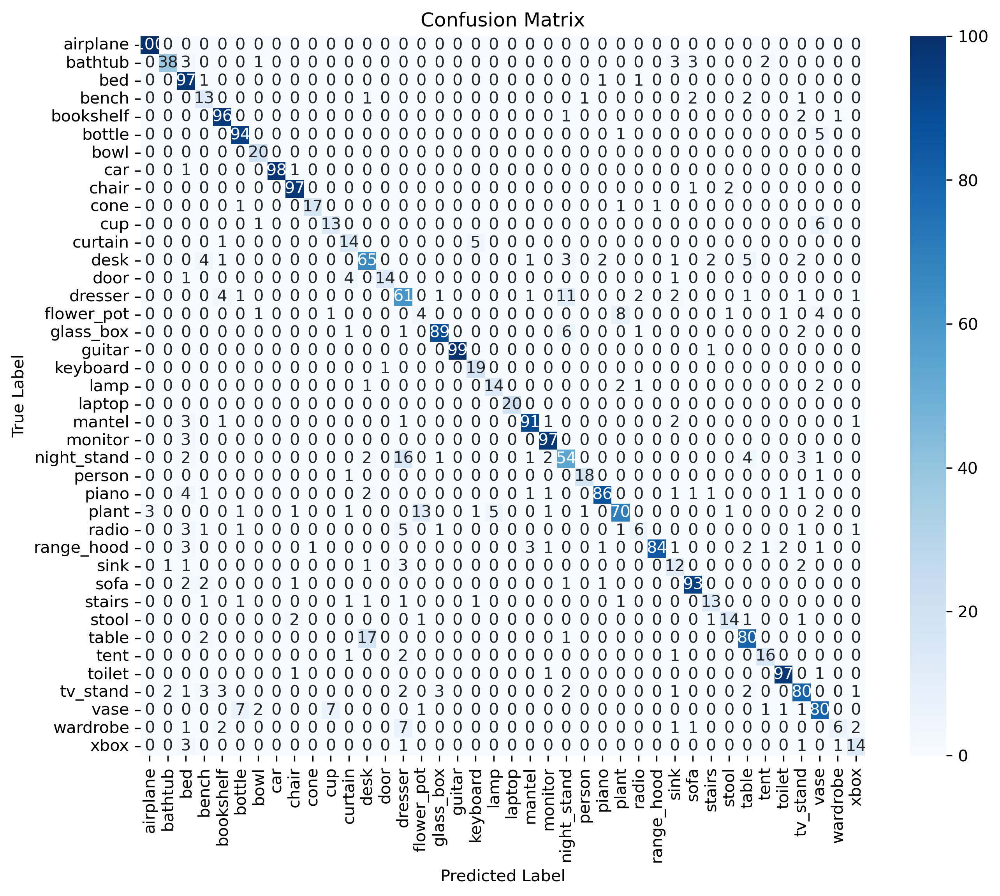

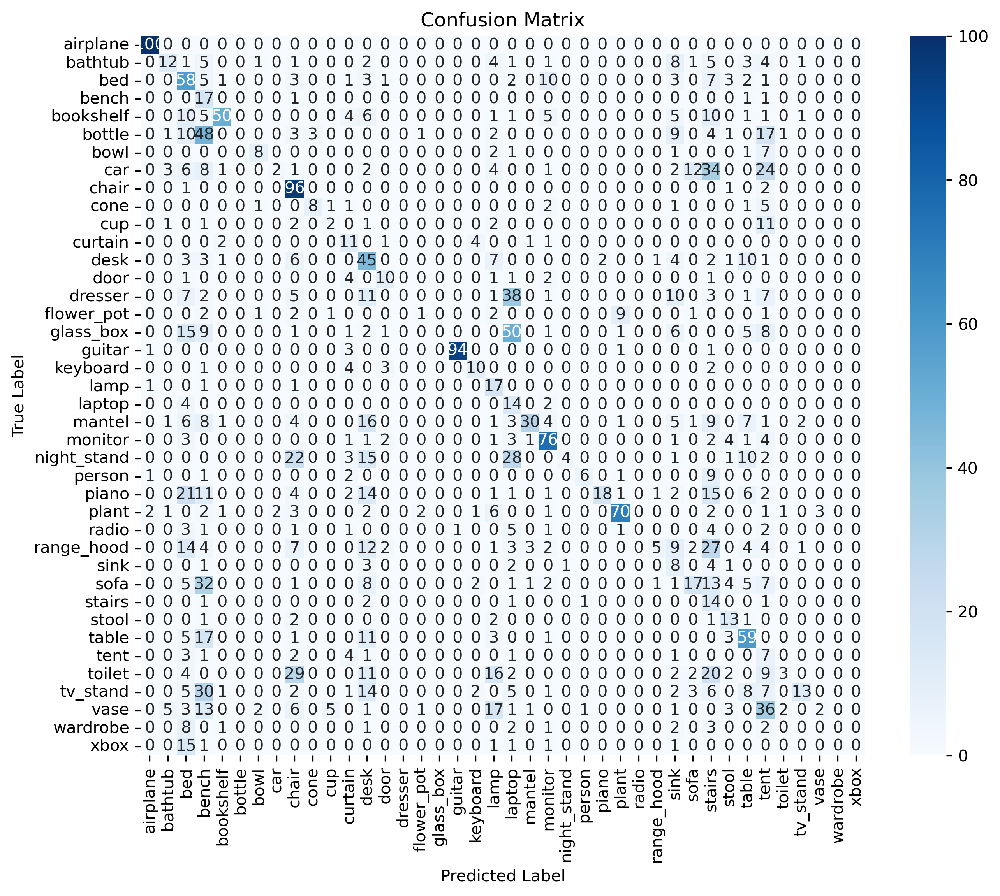

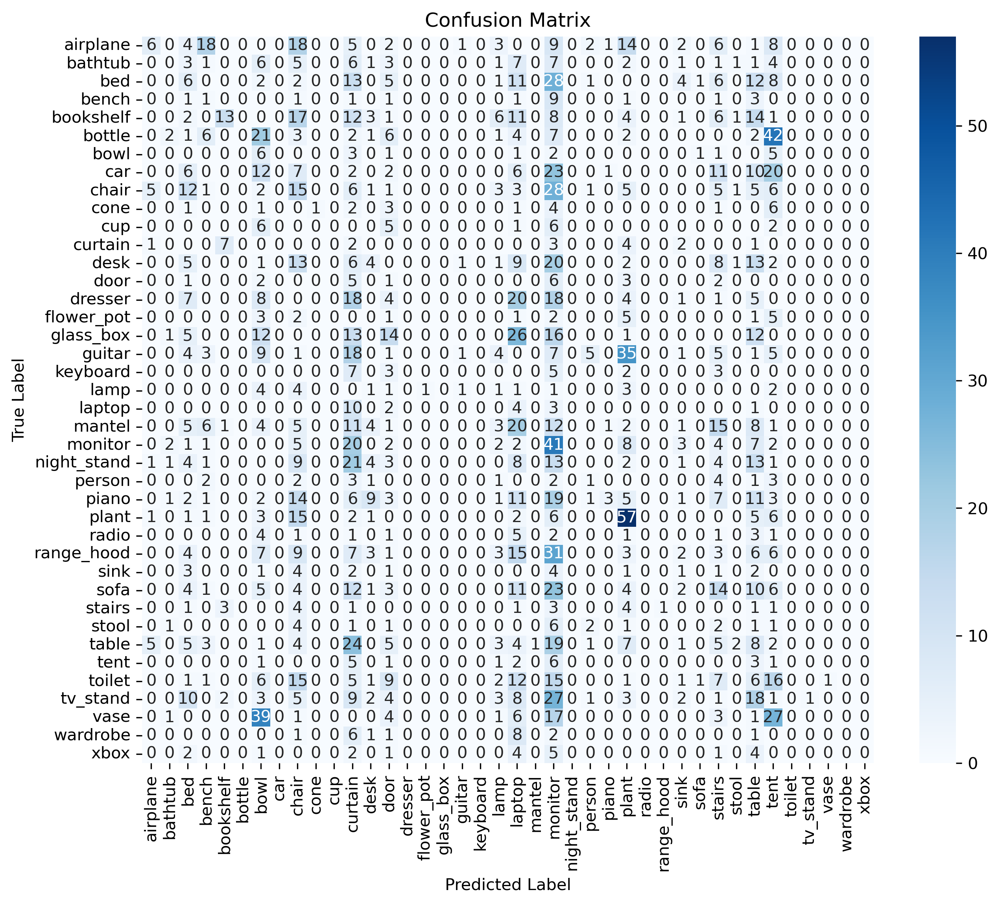

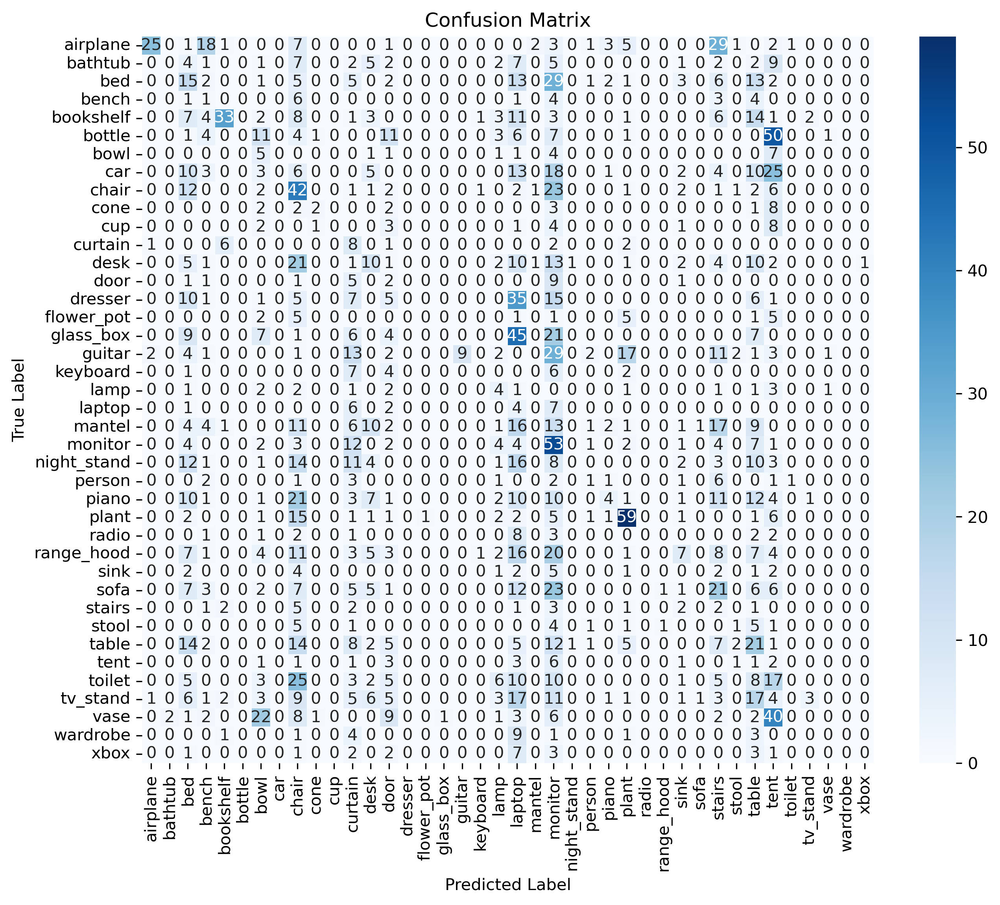

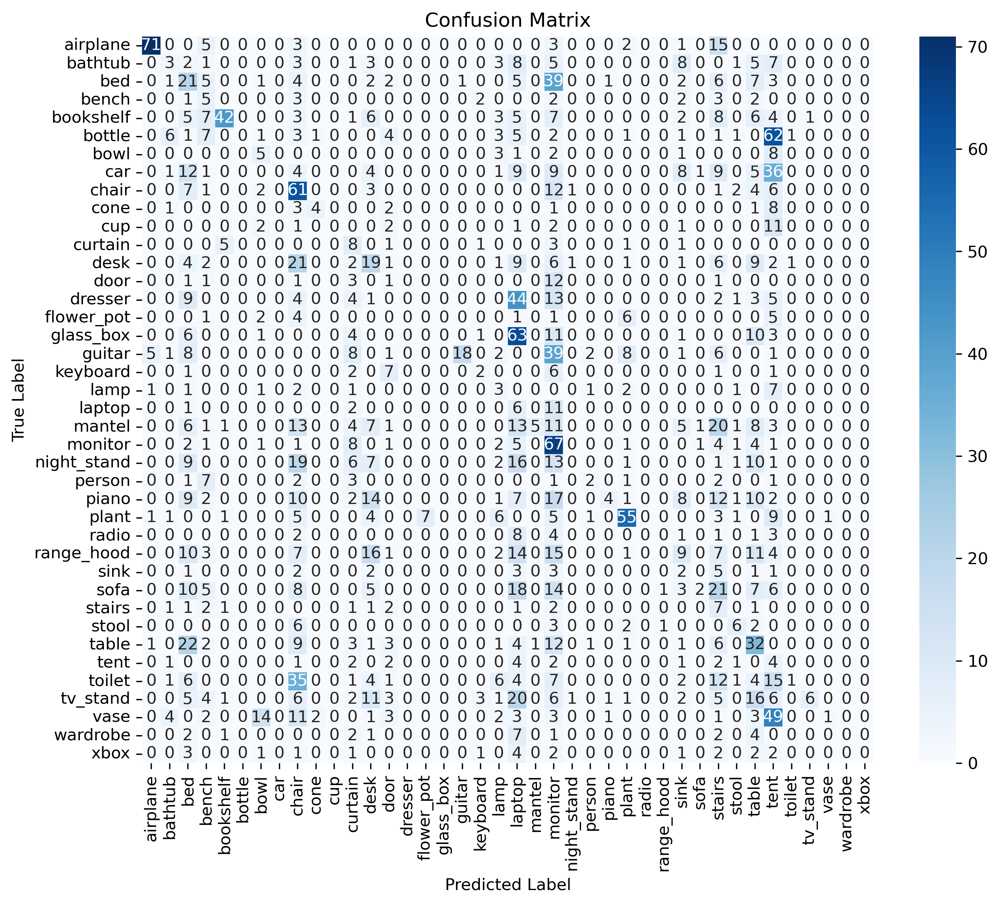

...

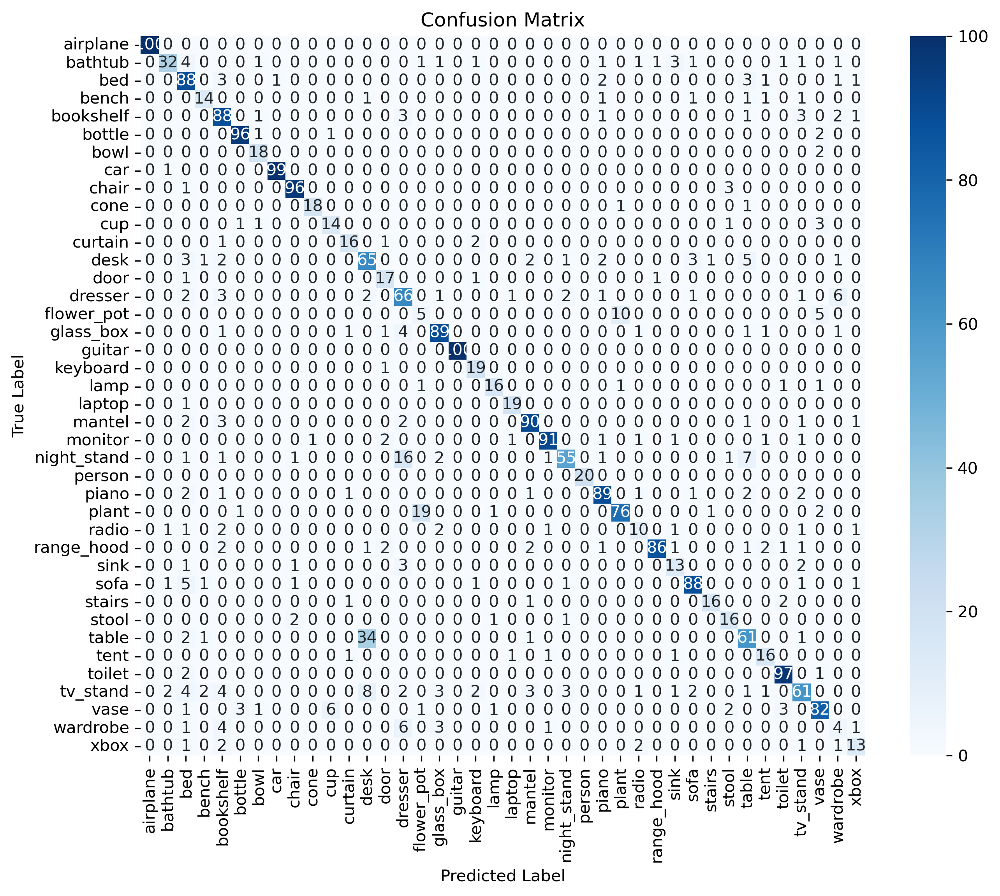

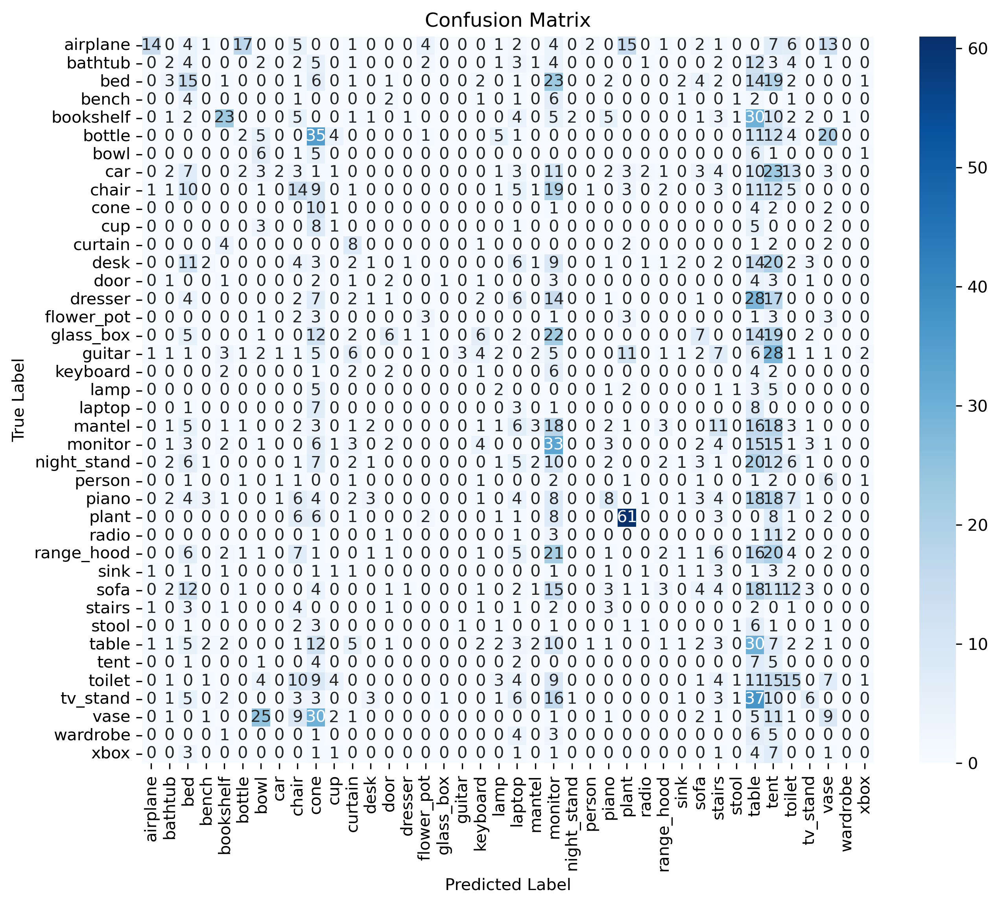

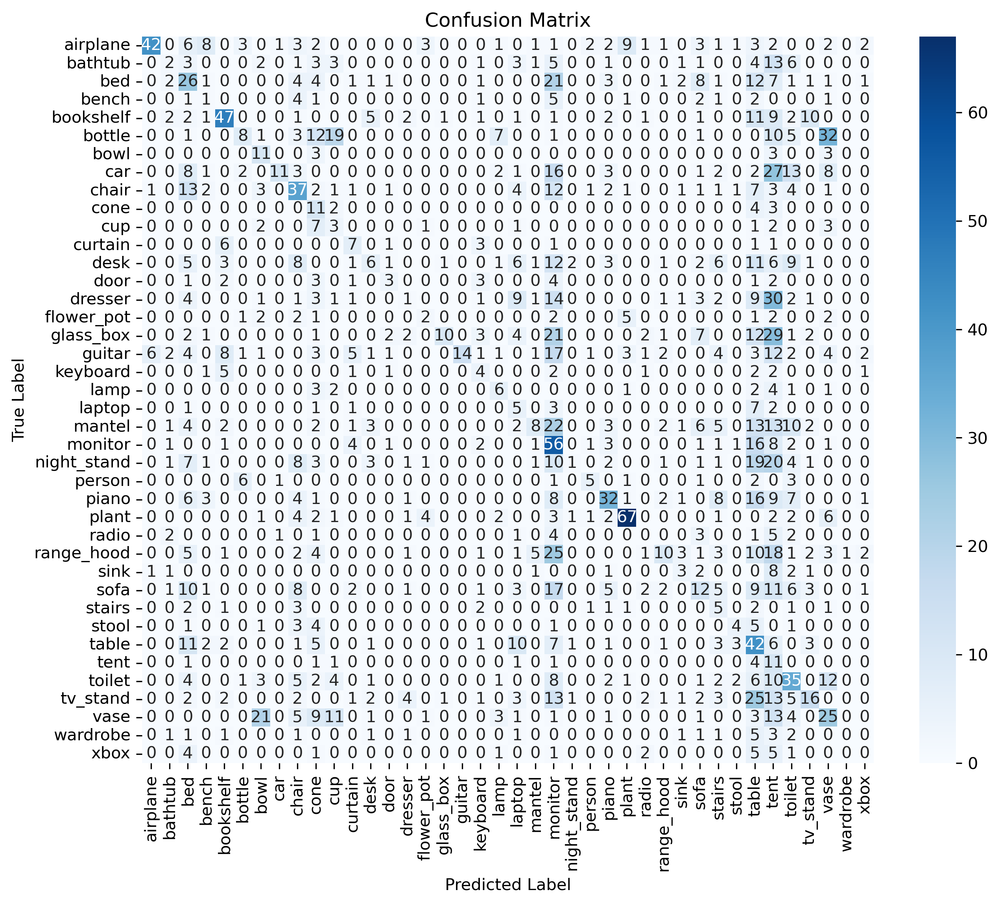

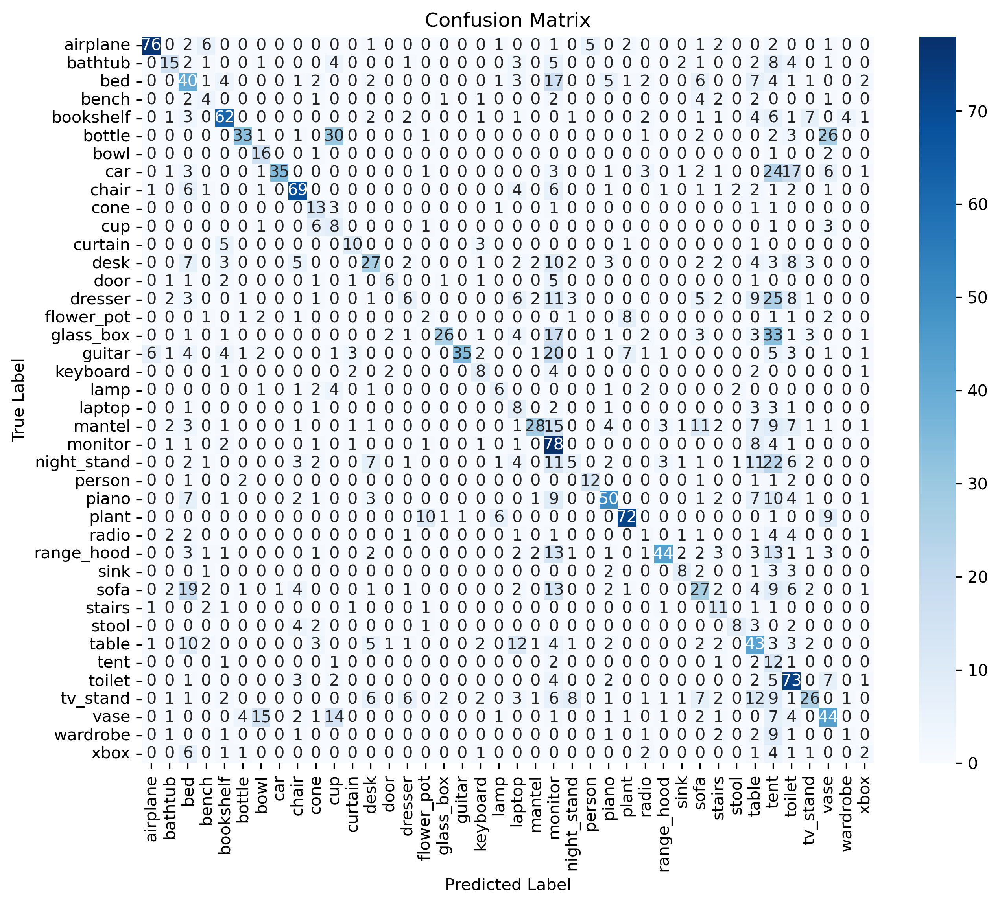

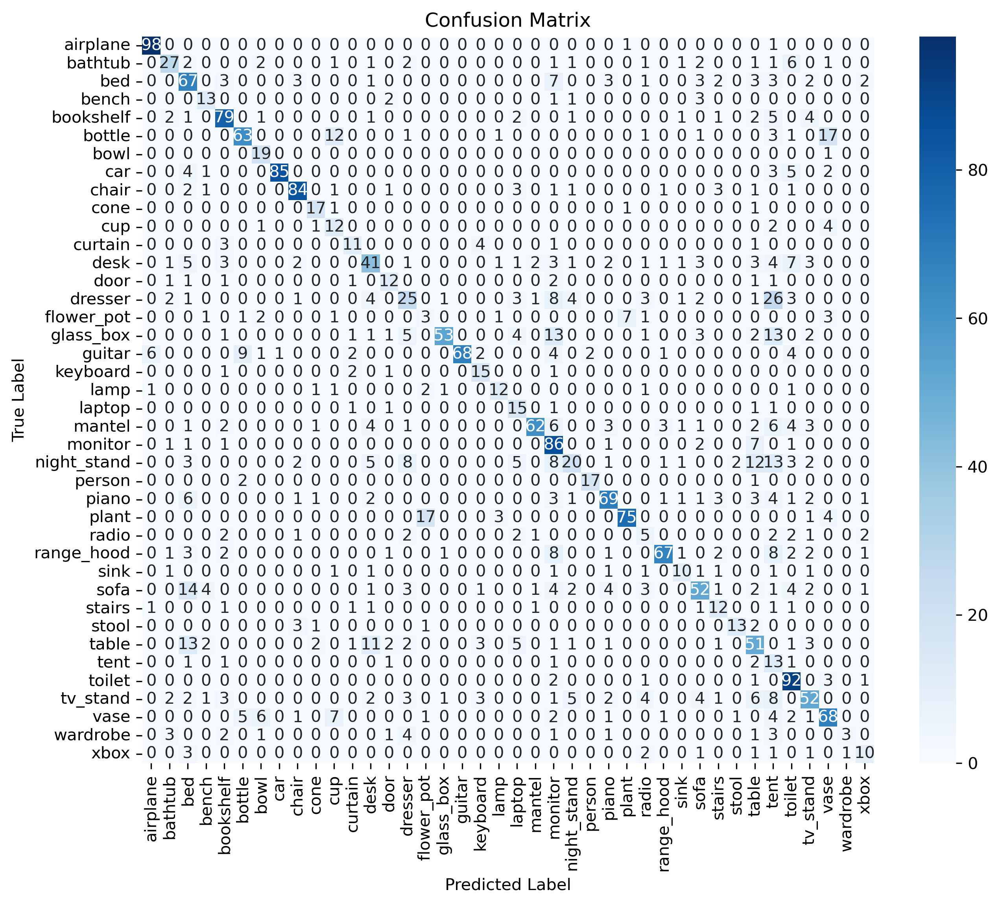

In [7]:
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
from sklearn.metrics import confusion_matrix

def make_confusion_matrix(y_true, y_pred, class_names):

    cm = confusion_matrix(y_true, y_pred)
    fig, ax = plt.subplots(figsize=(10, 8), dpi=300)
    ax = sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names.values(), yticklabels=class_names.values(), ax=ax)
    ax.set_xlabel('Predicted Label')
    ax.set_ylabel('True Label')
    ax.set_title('Confusion Matrix')
    
    return fig, ax

# Make the confusion matrix for all results, save to output folder
for _, model, test in tqdm(result_configs, desc="Drawing Confusion Matrices"):
    y_true = results[model][test]['y_true_cls']
    y_pred = results[model][test]['y_pred_cls']
    
    fig, ax = make_confusion_matrix(y_true, y_pred, class_names)
    fig.savefig(os.path.join(results_dir, f'cm_{model}_trained_{test}_tested.png'), bbox_inches='tight')

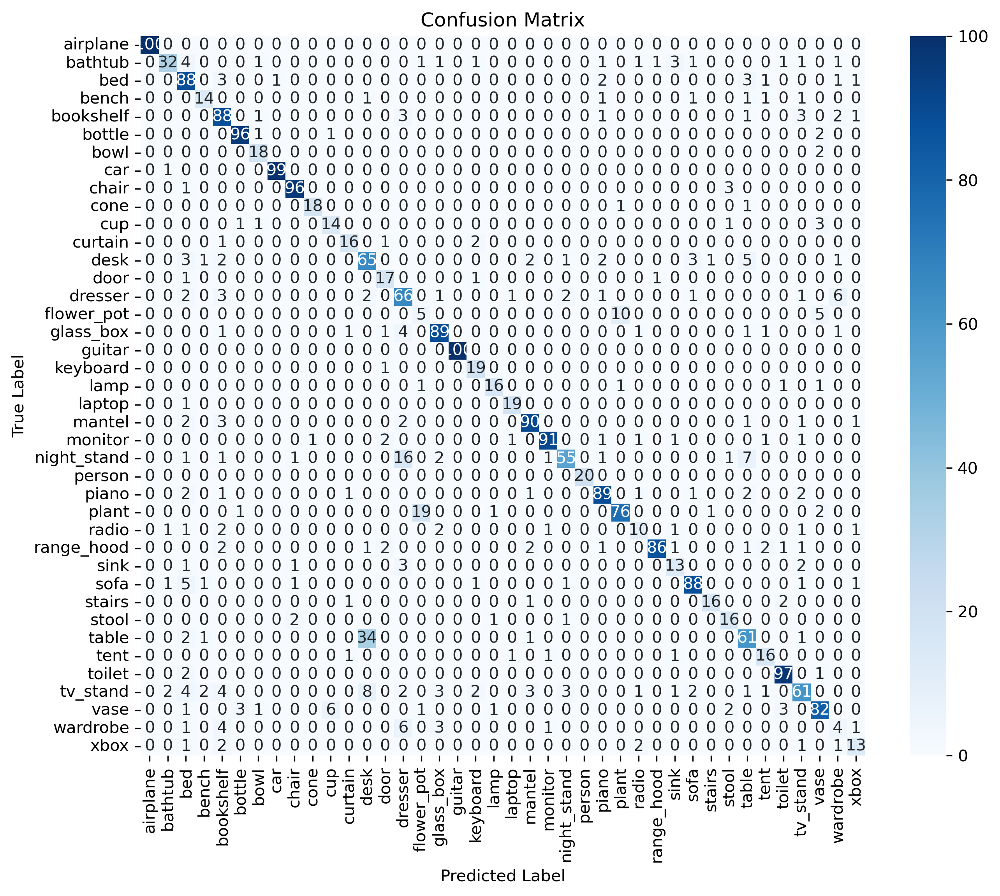

In [13]:
fig, ax = make_confusion_matrix(result_partialmodel_partialtest[1], result_partialmodel_partialtest[0], class_names)
plt.show()